# ANALYSING REVIEWS: BRANCH WISE
### EDA, RATINGS, FREQUECY PLOTS, WORDCLOUDS, POLARITY AND SUBJECTIVITY IN KEYWORDS BRANCH WISE


### Project Goal: 
To compare customer sentiment regarding attractions at three Disneyland locations (Anaheim, Paris, and Hong Kong) using sentiment analysis, emotion detection, and n-gram associations. To identify keywords using topic modeling that can help Disney determine visitor pain points and improve park experience.<br>
### Dataset:
Dataset is from [Kaggle](https://www.kaggle.com/arushchillar/disneyland-reviews) containing 42,000 reviews from TripAdvisor about three Disneyland branch locations: California, Paris, Hong Kong. here are 19,406 reviews about Anaheim, 13,630 about Paris, and 9,620 about Hong Kong. Data variables include Review_ID, Rating, Year_Month, Reviewer_Location, Review_Text, and Disneyland_Branch.<br>

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

import re

from PIL import Image
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
import nltk
#nltk.download('stopwords')
#nltk.download('punkt')
from nltk import FreqDist
from nltk.tokenize import RegexpTokenizer
from nltk.stem import WordNetLemmatizer
from nltk.corpus import stopwords
from nltk.stem import SnowballStemmer
from nltk.tokenize import word_tokenize

pd.options.mode.chained_assignment = None  # default='warn'


In [2]:
%matplotlib inline
sns.set_style("white")

class color:
   BLUE = '\033[94m'
   BOLD = '\033[1m'
   END = '\033[0m'

## Load Data:


In [3]:
Disneyland = pd.read_csv ('DisneylandReviews.csv', encoding='unicode_escape')
Disneyland.head()

,Review_ID,Rating,Year_Month,Reviewer_Location,Review_Text,Branch
0,670772142,4,2019-4,Australia,If you've ever been to Disneyland anywhere you...,Disneyland_HongKong
1,670682799,4,2019-5,Philippines,Its been a while since d last time we visit HK...,Disneyland_HongKong
2,670623270,4,2019-4,United Arab Emirates,Thanks God it wasn t too hot or too humid wh...,Disneyland_HongKong
3,670607911,4,2019-4,Australia,HK Disneyland is a great compact park. Unfortu...,Disneyland_HongKong
4,670607296,4,2019-4,United Kingdom,"the location is not in the city, took around 1...",Disneyland_HongKong


In [4]:
Disneyland.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 42656 entries, 0 to 42655
Data columns (total 6 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   Review_ID          42656 non-null  int64 
 1   Rating             42656 non-null  int64 
 2   Year_Month         42656 non-null  object
 3   Reviewer_Location  42656 non-null  object
 4   Review_Text        42656 non-null  object
 5   Branch             42656 non-null  object
dtypes: int64(2), object(4)
memory usage: 2.0+ MB


In [5]:
#To select rows whose column value equals 'missing' in 'Year_Month':
missing = Disneyland.loc[Disneyland['Year_Month'] == 'missing']
#keep the missing rows seperate
Disneyland = Disneyland[Disneyland.Year_Month != 'missing']

In [6]:
#get year fro the year_month
Disneyland['Year'] = pd.to_datetime(Disneyland['Year_Month']).dt.strftime('%Y')

In [7]:
#join back the missing in yaer_month
Disneyland = Disneyland.append(missing)
#Disneyland.tail()

C:\Users\chand\AppData\Local\Temp\ipykernel_18028\1263892137.py:2: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Disneyland = Disneyland.append(missing)


## Exploratory Data Analysis:
In this section I have done (EDA) to get a general idea of average ratings across all locations, where our visitors are from, and how the ratings changed over time.

Number of unique values in Branch is 3 



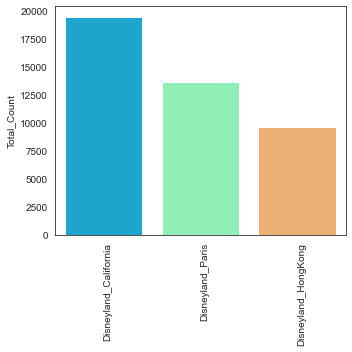

In [8]:
%matplotlib inline
count_uniques = pd.DataFrame(Disneyland['Branch'].value_counts()).rename(columns={'Branch':'Total_Count'}).sort_values('Total_Count',ascending=False)
print(color.BOLD +"Number of unique values in {} is {}".format('Branch', count_uniques.shape[0]), "\n"+ color.END)

# Create Figure
fig, ax = plt.subplots(figsize=(5,5))

ax = sns.barplot(x=count_uniques.index.values.tolist()  , y="Total_Count", data=count_uniques, palette= 'rainbow')
# rotates labels and aligns them horizontally to left 
plt.setp( ax.xaxis.get_majorticklabels(), rotation=90, ha="left" )

plt.tight_layout()
plt.show()

#### Rename the fields in Branch column
There are 3 fields in Branch column we will rename them for our convenience as following

In [9]:
Disneyland['Branch'] = Disneyland['Branch'].replace({'Disneyland_HongKong': 'HongKong', 
                                                     'Disneyland_California':'California', 
                                                     'Disneyland_Paris':'Paris'})


#### Average Ratings from each location and number of reviews for each location

In [10]:
avg_rating = pd.DataFrame(Disneyland.groupby(["Branch"]).agg({'Rating': ['mean', 'count']})).round(2).reset_index()
avg_rating

Branch Rating       
                mean  count
0  California   4.41  19406
1    HongKong   4.20   9620
2       Paris   3.96  13630

#### Average Ratings year wise

In [11]:
avg_rating_year = pd.DataFrame(Disneyland.groupby(["Branch",'Year']).agg({'Rating': ['mean']})).round(2)
avg_rating_year = avg_rating_year.unstack().T.reset_index().drop(columns=['level_0','level_1'])

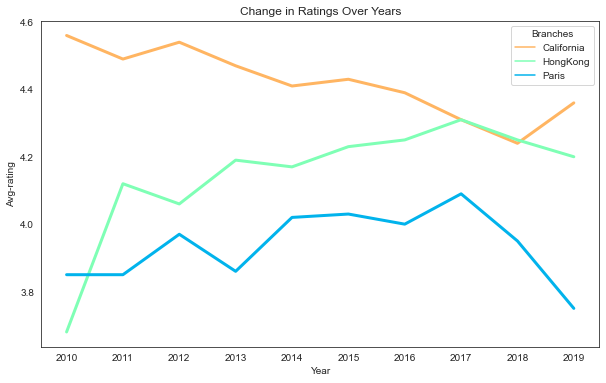

In [12]:
# Create Figure
fig, ax = plt.subplots(figsize=(10,6))

ax =sns.lineplot(x='Year', y='Avg-rating', hue='Branches', palette= 'rainbow_r', lw=3,
                 data = avg_rating_year.melt('Year', var_name='Branches', value_name='Avg-rating')).set_title('Change in Ratings Over Years')

#### Total Reviews per Year

In [13]:
reviews_per_year = pd.DataFrame(Disneyland.groupby(["Branch",'Year']).agg({'Rating': ['count']})).round(2)
reviews_per_year = reviews_per_year.unstack().T.reset_index().drop(columns=['level_0','level_1'])

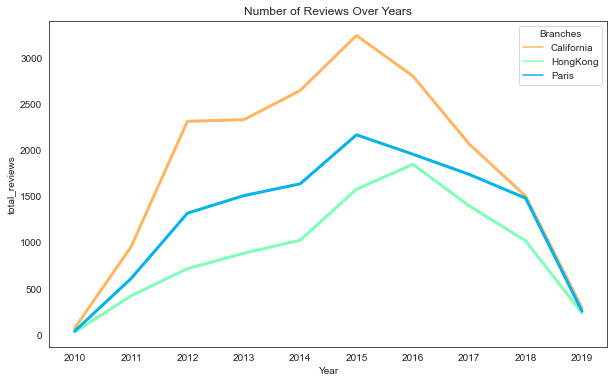

In [14]:
# Create Figure
fig, ax = plt.subplots(figsize=(10,6))

ax =sns.lineplot(x='Year', y='total_reviews', hue='Branches', palette= 'rainbow_r', lw=3,
                 data = reviews_per_year.melt('Year', var_name='Branches', value_name='total_reviews')).set_title('Number of Reviews Over Years')

#### Rating distribution among locations

In [15]:
ratingcount = pd.DataFrame(Disneyland.groupby('Branch')['Rating'].value_counts())
ratingcount = ratingcount.unstack().T.reset_index().drop(columns=['level_0'])
for column in ['California','HongKong','Paris']:
    ratingcount[column]  = ratingcount[column].apply(lambda row: row/ratingcount[column].sum()*100).round(0)

ratingcount

Branch,Rating,California,HongKong,Paris
0,1,3.0,2.0,6.0
1,2,4.0,3.0,8.0
2,3,9.0,14.0,15.0
3,4,21.0,34.0,26.0
4,5,65.0,47.0,45.0


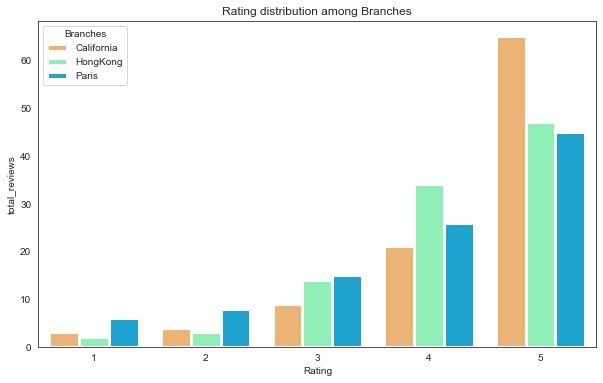

In [16]:
# Create Figure
fig, ax = plt.subplots(figsize=(10,6))

ax =sns.barplot(x='Rating', y='total_reviews', hue='Branches', palette= 'rainbow_r', lw=3,
                 data = ratingcount.melt('Rating', var_name='Branches', value_name='total_reviews')).set_title('Rating distribution among Branches')

#### Visualize where visitors are from


Top 10 review locations for Disnelyland branch in California


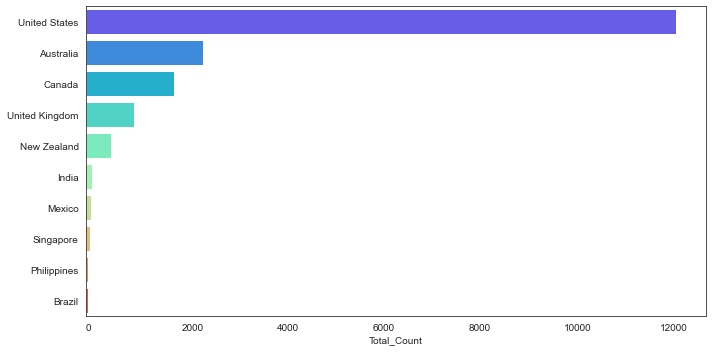

Top 10 review locations for Disnelyland branch in Paris


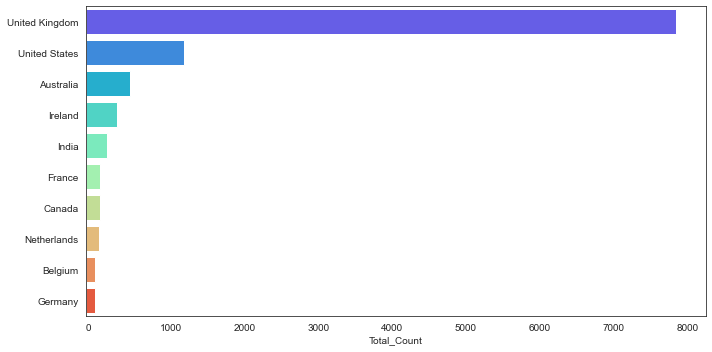

Top 10 review locations for Disnelyland branch in HongKong


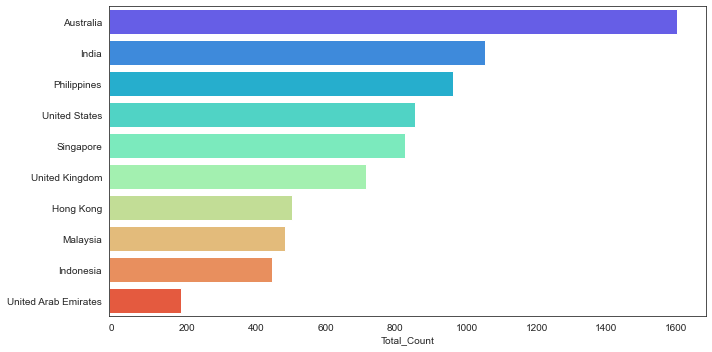

In [17]:
for branch in ['California', 'Paris', 'HongKong']:
    count_uniques = pd.DataFrame(Disneyland.groupby('Branch').get_group(branch)['Reviewer_Location'].value_counts().iloc[:10]).rename(columns={'Reviewer_Location':'Total_Count'}).sort_values('Total_Count',ascending=False)
    print(color.BOLD +"Top 10 review locations for Disnelyland branch in {}".format(branch)+ color.END)

    # Create Figure
    fig, ax = plt.subplots(figsize=(10,5))

    ax = sns.barplot(y=count_uniques.index.values.tolist()  , x="Total_Count", data=count_uniques, palette= 'rainbow')
    # rotates labels and aligns them horizontally to left 
    plt.setp( ax.xaxis.get_majorticklabels(), ha="left" )

    plt.tight_layout()
    plt.show()


## Word Clouds:
These word clouds have a general idea of what visitors talk about their visit to Disneyland in their review. Only English reviews are considered also duplicate reviews are removed. To create the word clouds, we tokenized words and removed stopwords. 

In [18]:
def generate_branch_wordcloud(branch, img):
    branch_data =  Disneyland.loc[Disneyland['Branch'] == branch]
    
    text = " ".join(review for review in branch_data.Review_Text)
    
    tokenizer = RegexpTokenizer(r'\w+')
    text = text.lower()
    cleaned_text = re.sub('\W', ' ', text)
    stopword = stopwords.words("english")
    snowball_stemmer = SnowballStemmer("english")
    word_tokens = nltk.word_tokenize(cleaned_text)
    stemmed_word = [snowball_stemmer.stem(word) for word in word_tokens]
    stopword_text = [word for word in stemmed_word if word not in stopword]
        
    #remove custom stop words
    my_stopwords = ['park', 'disney', 'disneyland', 'disney land', 'disney world',
                    'disneyworld', 'california', 'hong kong', 'paris']
    processed_text = [word for word in stopword_text if word not in my_stopwords]
    
    freq = FreqDist(processed_text)
    freq.plot(20);
    
    text_string=(" ").join(processed_text)
    
    mask = np.array(Image.open(img))
    wordcloud = WordCloud(background_color="white", font_path='arial', max_words=200,
                          mask=mask, contour_color='grey', contour_width=1).generate(text_string)
    image_colors = ImageColorGenerator(mask)

    plt.figure(figsize=(13,10))
    
    plt.imshow(wordcloud.recolor(),interpolation="bilinear")
    plt.axis("off")
    
    plt.show()


Frequency plot and wordcloud for reviews for Disneyland in California


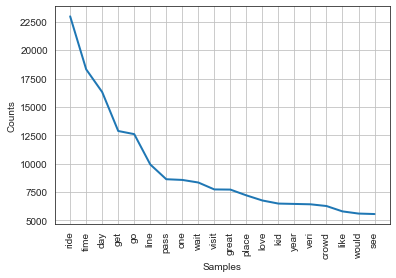

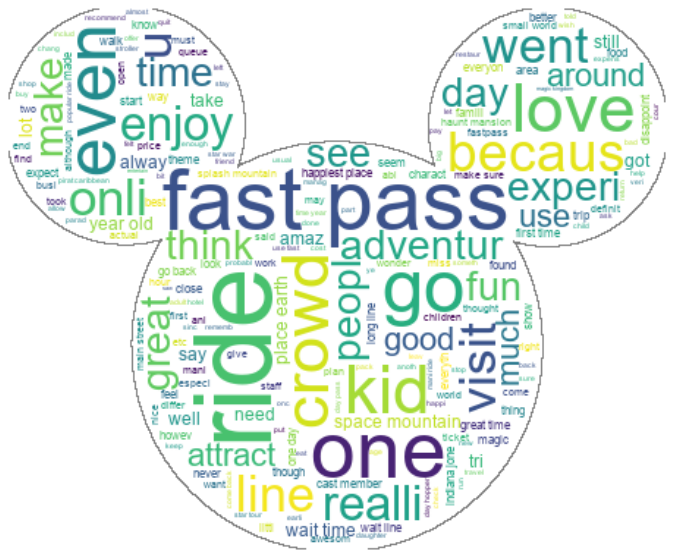

Frequency plot and wordcloud for reviews for Disneyland in Paris


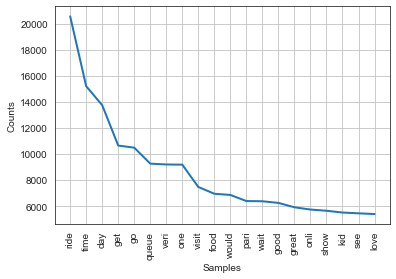

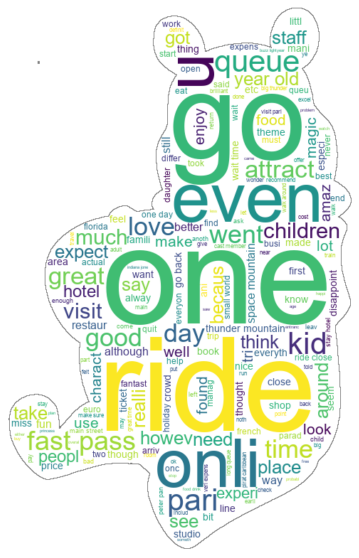

Frequency plot and wordcloud for reviews for Disneyland in HongKong


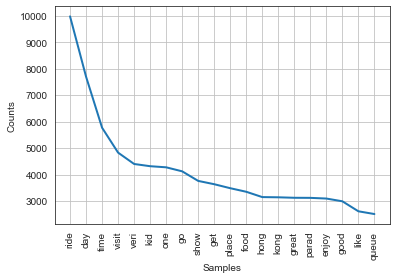

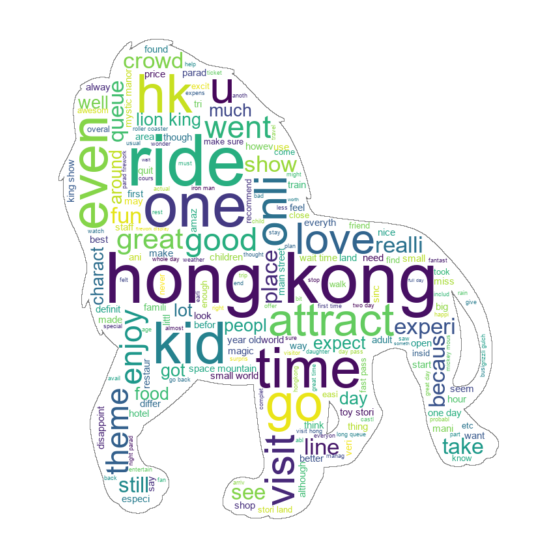

In [19]:
branches=['California','Paris','HongKong']
images=['mickymouse.png', 'winnie.png', 'lionking.png' ]
for branch,image in zip(branches,images):
    print(color.BOLD +"Frequency plot and wordcloud for reviews for Disneyland in {}".format(branch)+ color.END)
    generate_branch_wordcloud(branch, image)

In general, the reviews from all three locations mention fast passes, lines or queues, visitor demographic, rides and attractions.


## Sentiment Analysis
Sentiment analysis is basically the process of determining the attitude or the emotion of the writer, i.e., whether it is positive or negative or neutral.<br>
In this section we will We want to take a deeper look into what the reviews reveal visitor sentiment. For this step, I used three methods to obtain sentiment using TextBlob and Vader.

### Sentiment Analysis using TextBlob

The sentiment function of textblob returns two properties, polarity, and subjectivity.

#### What is Sentiment Polarity
* It is the expression that determines the sentimental aspect of an opinion. In textual data, the result of sentiment analysis can be determined for each entity in the sentence, document or sentence. The sentiment polarity can be determined as positive, negative and neutral.
* Polarity is float which lies in the range of [-1,1] where 1 means positive statement and -1 means a negative statement.
#### What is Sentiment Subjectivity
* Subjectivity quantifies the amount of personal opinion and factual information contained in the text. The higher subjectivity means that the text contains personal opinion rather than factual information.
* Subjectivity is also a float which lies in the range of [0,1].

TextBlob has one more parameter — intensity. TextBlob calculates subjectivity by looking at the ‘intensity’. Intensity determines if a word modifies the next word. For English, adverbs are used as modifiers (‘very good’).

### VADER Sentiment Analysis :

VADER (Valence Aware Dictionary and sEntiment Reasoner) is a lexicon and rule-based sentiment analysis tool that is specifically attuned to sentiments expressed in social media.<br>
VADER uses a combination of A sentiment lexicon is a list of lexical features (e.g., words) which are generally labeled according to their semantic orientation as either positive or negative.<br>
VADER not only tells about the Positivity and Negativity score but also tells us about how positive or negative a sentiment is.

The Lexicon-based approach uses pre-prepared sentiment lexicon to score a document by aggregating the sentiment scores of all the words in the document [45–47]. The pre-prepared sentiment lexicon should contain a word and corresponding sentiment score to it.

### 1. This method uses compound score to assign sentiment “positive” or “negative”.

The Compound score is a metric that calculates the sum of all the lexicon ratings which have been normalized between -1(most extreme negative) and +1 (most extreme positive).<br>
* positive sentiment : (compound score >= 0.05) <br>
* neutral sentiment : (compound score > -0.05) and (compound score < 0.05) <br>
* negative sentiment : (compound score <= -0.05)<br>

### *sentiment analysis VADER compound score*

In [20]:
from textblob import TextBlob
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer

def detect_tb_polarity(text):
    return TextBlob(text).sentiment.polarity
def detect_tb_subjectivity(text):
    return TextBlob(text).sentiment.subjectivity

vader = SentimentIntensityAnalyzer()

def detect_vader_pos(text):
    return vader.polarity_scores(text)['pos']

def detect_vader_neg(text):
    return vader.polarity_scores(text)['neg']

def detect_vader_comp(text):
    return vader.polarity_scores(text)['compound']

In [21]:
def sentiment_analysis(branch):
    branch_data =  Disneyland.loc[Disneyland['Branch'] == branch]

    branch_data['tb_polarity'] = branch_data.Review_Text.apply(detect_tb_polarity)
    branch_data['tb_subjectivity'] = branch_data.Review_Text.apply(detect_tb_subjectivity)

    branch_data['vader_pos'] = branch_data.Review_Text.apply(detect_vader_pos)
    branch_data['vader_neg'] = branch_data.Review_Text.apply(detect_vader_neg)
    branch_data['vader_comp'] = branch_data.Review_Text.apply(detect_vader_comp)
    return branch_data

### *Keyword Matching*

In [22]:
# Define a function to plot word cloud
def plot_cloud(wordcloud):
    # Set figure size
    plt.figure(figsize=(40, 30))
    # Display image
    plt.imshow(wordcloud) 
    # No axis details
    plt.axis("off")

#Graphs polarity and subjectivity of keywords
def keyword(specific_words):
    query = '|'.join(specific_words)
    branch_data['query_match'] = branch_data['Review_Text'].str.lower().str.contains(query)
    
    #### Make a df with keywords
    matches = branch_data[(branch_data['query_match'] == True)]
    print(color.BOLD +"There are {} reviews with keywords {}".format(matches.shape[0], specific_words)+ color.END)
    
    # Create Figure
    fig, (ax1, ax2) = plt.subplots(nrows=2, ncols=1, figsize=(10,13))

    sns.histplot(matches, x="tb_polarity", hue="sentiment", element="step",
                 stat="density", common_norm=False, ax=ax1).set(title='Polarity in reviews with keywords')
    
    sns.histplot(matches, x="tb_subjectivity", hue="sentiment", element="poly",
                 stat="density", common_norm=False,ax=ax2).set(title='Subjectivity in reviews with keywords')

    fig.tight_layout(pad=2.0)
    
    #### Positive reviews with keywords
    positive_and_keyword_match = branch_data[(branch_data['query_match'] == True) & (branch_data['sentiment'] == 'Positive')]
    
    #positive_and_keyword_match_text = positive_and_keyword_match['Review_Text']
    #all_sentences = []
    
    text = " ".join(review for review in positive_and_keyword_match.Review_Text)
    
    tokenizer = RegexpTokenizer(r'\w+')
    text = text.lower()
    cleaned_text = re.sub('\W', ' ', text)
    stopword = stopwords.words("english")
    snowball_stemmer = SnowballStemmer("english")
    word_tokens = nltk.word_tokenize(cleaned_text)
    stemmed_word = [snowball_stemmer.stem(word) for word in word_tokens]
    stopword_text = [word for word in stemmed_word if word not in stopword]
        
    #remove custom stop words
    my_stopwords = ['park', 'disney', 'disneyland', 'disney land', 'disney world',
                    'disneyworld', 'california', 'hong kong','kong', 'hong', 'paris']
    processed_text = [word for word in stopword_text if word not in my_stopwords]
    
    text_string=(" ").join(processed_text)


    #for word in positive_and_keyword_match_text:
        #all_sentences.append(word)
        
    #tags = positive_and_keyword_match_text.map(lambda x:x.lower().split('|')).values
    #splt_tags = ' '.join(positive_and_keyword_match_text)
    
    wordcloud = WordCloud(width = 3000, height = 2000, 
                          random_state=1, background_color='black', 
                          colormap='Set2', collocations=False).generate(' '.join(text_string.split('|')))
    # Plot
    plot_cloud(wordcloud)

### "Results of sentiment analysis for reviews of Disneyland in HongKong"

In [23]:
branch='HongKong'
branch_data = sentiment_analysis(branch)
branch_data.head()

,Review_ID,Rating,Year_Month,Reviewer_Location,Review_Text,Branch,Year,tb_polarity,tb_subjectivity,vader_pos,vader_neg,vader_comp
0,670772142,4,2019-4,Australia,If you've ever been to Disneyland anywhere you...,HongKong,2019,0.243981,0.561481,0.109,0.000,0.7069
1,670682799,4,2019-5,Philippines,Its been a while since d last time we visit HK...,HongKong,2019,0.236131,0.434649,0.195,0.044,0.9853
2,670623270,4,2019-4,United Arab Emirates,Thanks God it wasn t too hot or too humid wh...,HongKong,2019,0.160498,0.422944,0.220,0.022,0.9920
3,670607911,4,2019-4,Australia,HK Disneyland is a great compact park. Unfortu...,HongKong,2019,0.189286,0.512143,0.154,0.078,0.8425
4,670607296,4,2019-4,United Kingdom,"the location is not in the city, took around 1...",HongKong,2019,0.266667,0.437500,0.098,0.000,0.2846


In [24]:
branch_data.shape

(9620, 12)

In [25]:
branch_data['vader_comp'].describe()

count    9620.000000
mean        0.717701
std         0.415145
min        -0.998100
25%         0.680800
50%         0.897700
75%         0.963100
max         0.999800
Name: vader_comp, dtype: float64

In [26]:
# labeling the data
#assign sentiment based on compound score

rating = branch_data["vader_comp"]

def rating_label(rating):
    if rating >=0.65:
        return "Positive"
    elif (rating >=0.4) & (rating <= 0.65):
        return "Neutral"
    else:
        return "Negative"
        
branch_data["sentiment"] = branch_data["vader_comp"].apply(lambda x: rating_label(x))  

In [27]:
print(branch_data['sentiment'].value_counts())
branch_data = branch_data[branch_data.sentiment != 'Neutral']

Positive    7344
Negative    1402
Neutral      874
Name: sentiment, dtype: int64


In [28]:
branch_data['sentiment'].value_counts()

Positive    7344
Negative    1402
Name: sentiment, dtype: int64

Understanding Polarity and Subjectivity in keywords ['fast pass', 'fastpass']
There are 388 reviews with keywords ['fast pass', 'fastpass']


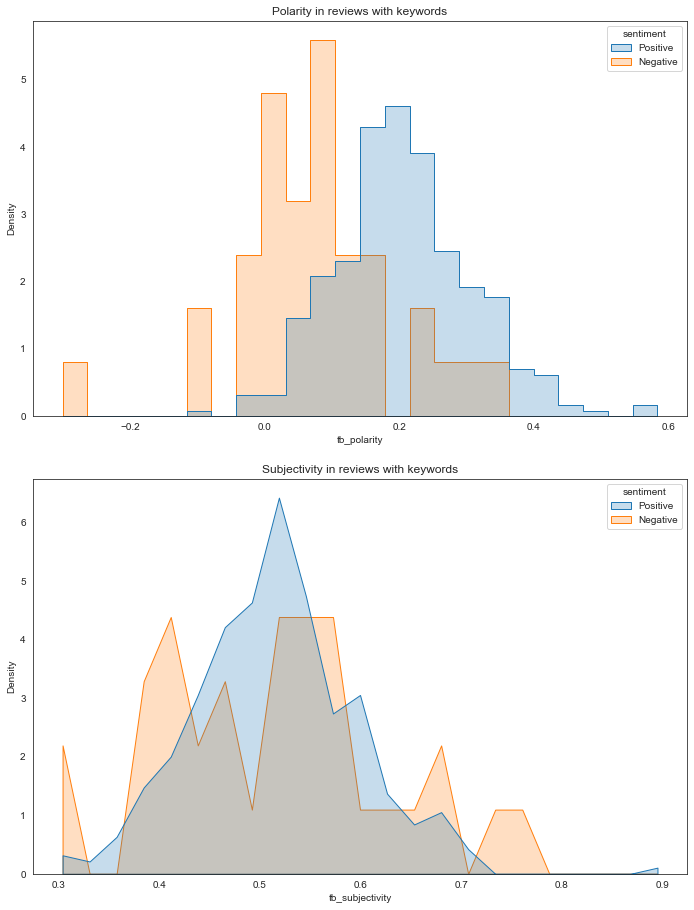

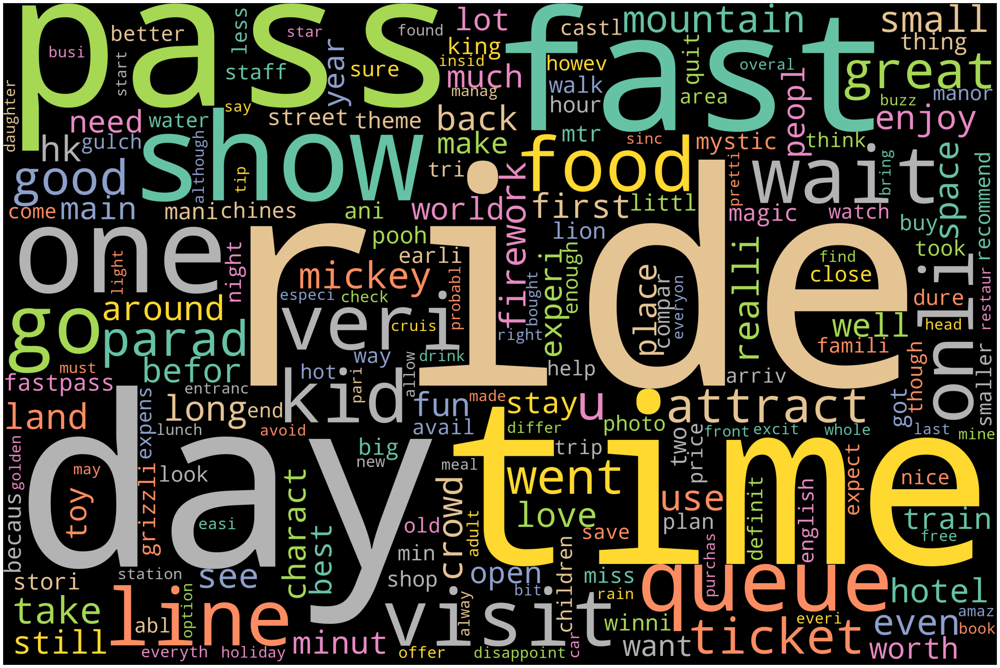

In [29]:
specific_words = ['fast pass', 'fastpass']
print(color.BOLD +"Understanding Polarity and Subjectivity in keywords {}".format(specific_words)+ color.END)
keyword(specific_words)

Understanding Polarity and Subjectivity in keywords ['ride']
There are 4859 reviews with keywords ['ride']


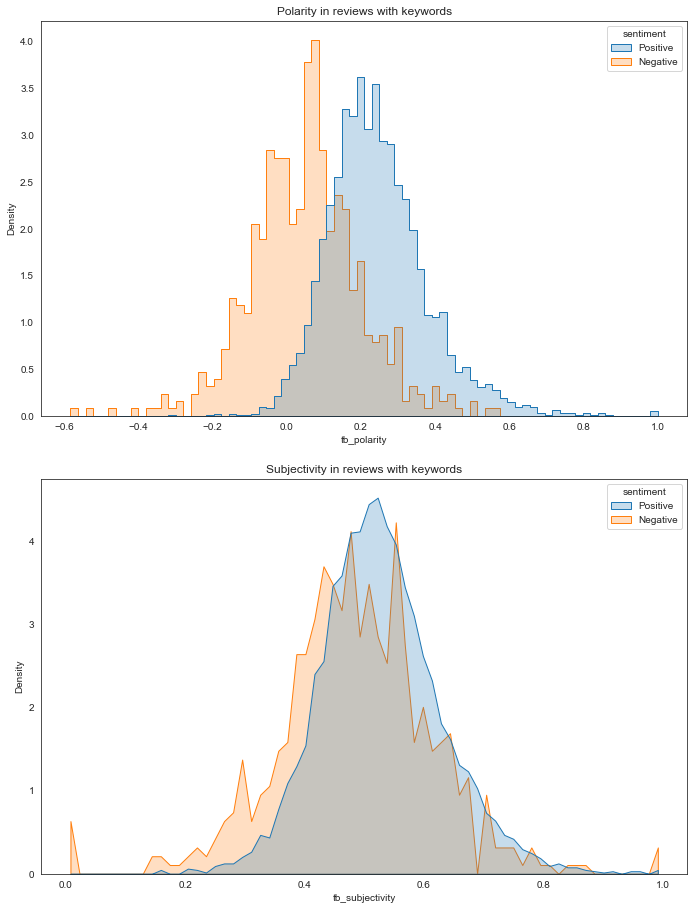

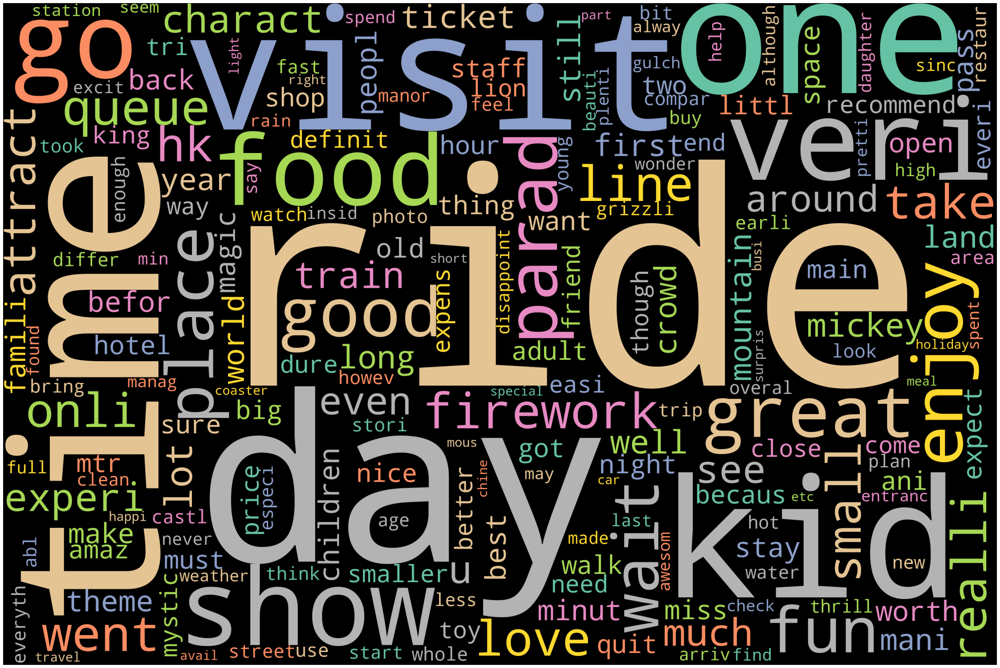

In [30]:
specific_words = ['ride']
print(color.BOLD +"Understanding Polarity and Subjectivity in keywords {}".format(specific_words)+ color.END)
keyword(specific_words)

Understanding Polarity and Subjectivity in keywords ['line', 'queue', 'wait', 'time']
There are 5147 reviews with keywords ['line', 'queue', 'wait', 'time']


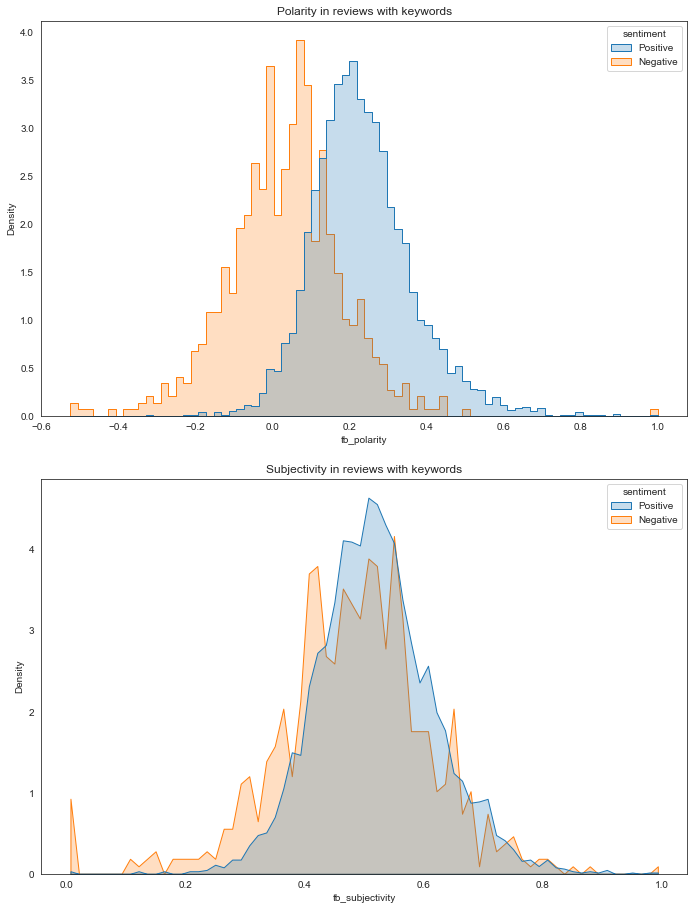

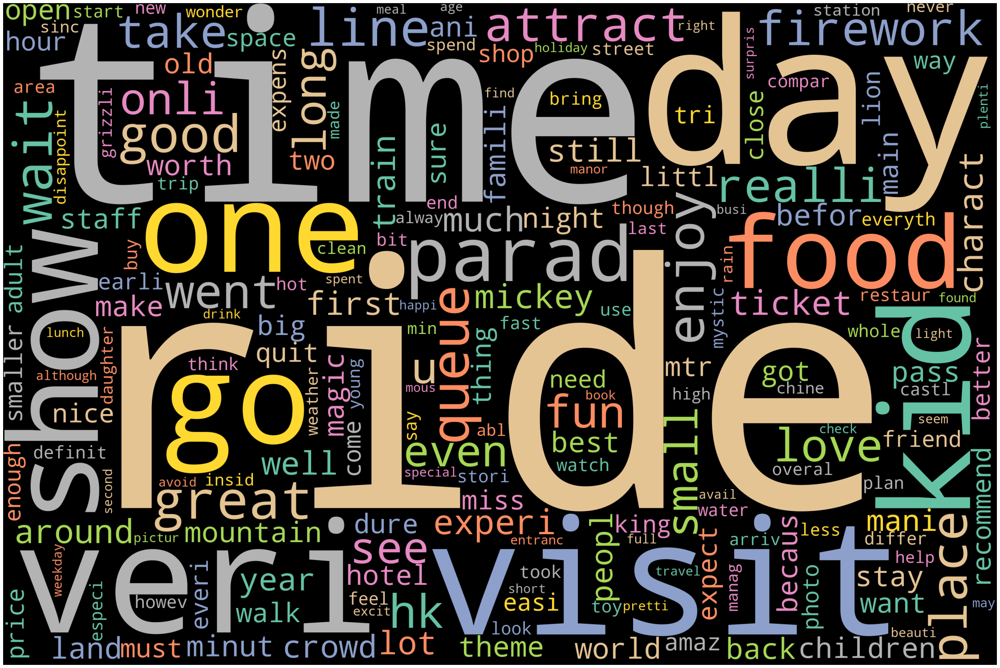

In [31]:
specific_words = ['line', 'queue','wait', 'time']
print(color.BOLD +"Understanding Polarity and Subjectivity in keywords {}".format(specific_words)+ color.END)
keyword(specific_words)

### "Results of sentiment analysis for reviews of Disneyland in Paris"

In [32]:
branch='Paris'
branch_data = sentiment_analysis(branch)
branch_data.head()

,Review_ID,Rating,Year_Month,Reviewer_Location,Review_Text,Branch,Year,tb_polarity,tb_subjectivity,vader_pos,vader_neg,vader_comp
29026,670721950,5,2019-3,United Arab Emirates,"We've been to Disneyland Hongkong and Tokyo, s...",Paris,2019,0.287500,0.550000,0.179,0.000,0.9555
29027,670686565,4,2018-6,United Kingdom,I went to Disneyland Paris in April 2018 on Ea...,Paris,2018,0.400000,0.851111,0.126,0.034,0.9735
29028,670606796,5,2019-4,United Kingdom,"What a fantastic place, the queues were decent...",Paris,2019,0.135185,0.566667,0.253,0.056,0.9481
29029,670586937,4,2019-4,Australia,We didn't realise it was school holidays when ...,Paris,2019,0.143370,0.527101,0.126,0.062,0.7584
29031,670400930,5,2019-4,United Kingdom,Such a magical experience. I recommend making ...,Paris,2019,0.242857,0.571429,0.163,0.036,0.8591


In [33]:
branch_data.shape

(13630, 12)

In [34]:
branch_data['vader_comp'].describe()

count    13630.000000
mean         0.647531
std          0.545911
min         -0.996900
25%          0.625025
50%          0.907900
75%          0.972975
max          0.999900
Name: vader_comp, dtype: float64

In [35]:
# labeling the data
#assign sentiment based on compound score

rating = branch_data["vader_comp"]

def rating_label(rating):
    if rating >=0.65:
        return "Positive"
    elif (rating >=0.4) & (rating <= 0.65):
        return "Neutral"
    else:
        return "Negative"
        
branch_data["sentiment"] = branch_data["vader_comp"].apply(lambda x: rating_label(x))  

In [36]:
print(branch_data['sentiment'].value_counts())
branch_data = branch_data[branch_data.sentiment != 'Neutral']

Positive    10102
Negative     2561
Neutral       967
Name: sentiment, dtype: int64


In [37]:
branch_data['sentiment'].value_counts()

Positive    10102
Negative     2561
Name: sentiment, dtype: int64

Understanding Polarity and Subjectivity in keywords ['fast pass', 'fastpass']
There are 2361 reviews with keywords ['fast pass', 'fastpass']


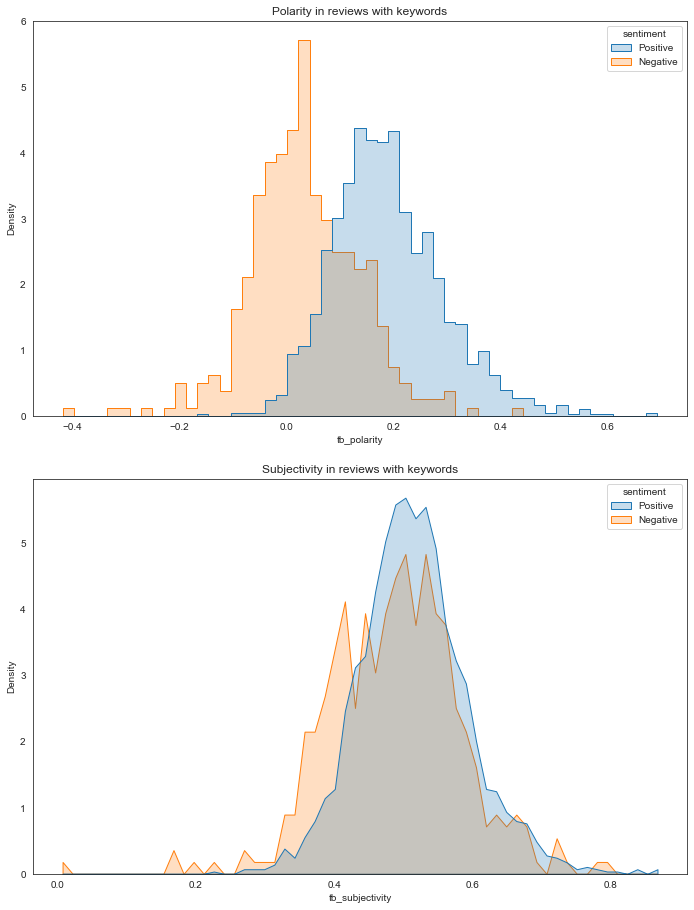

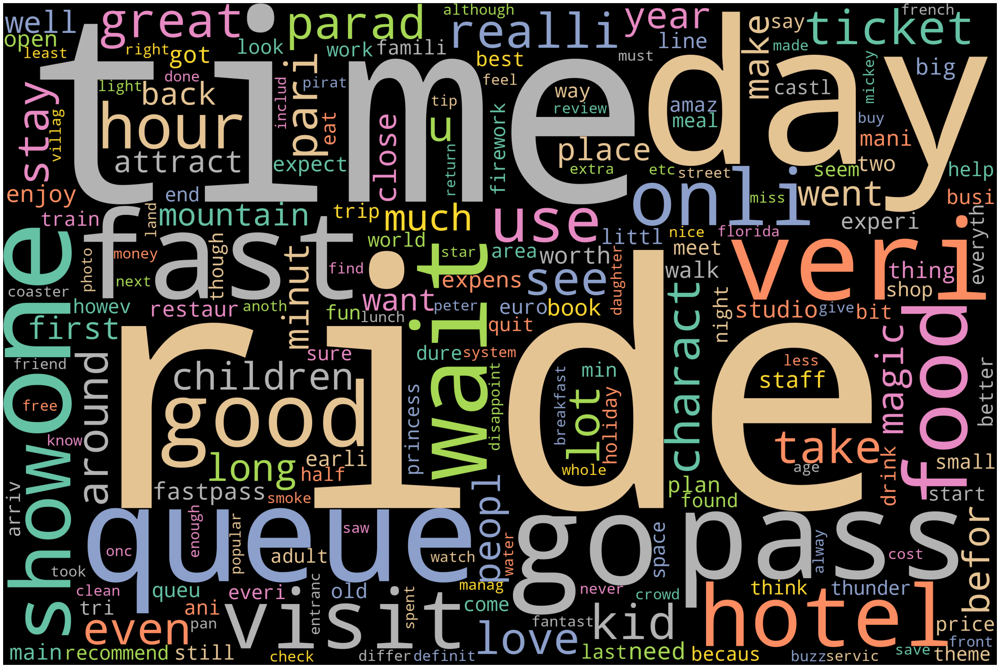

In [38]:
specific_words = ['fast pass', 'fastpass']
print(color.BOLD +"Understanding Polarity and Subjectivity in keywords {}".format(specific_words)+ color.END)
keyword(specific_words)

Understanding Polarity and Subjectivity in keywords ['ride']
There are 8064 reviews with keywords ['ride']


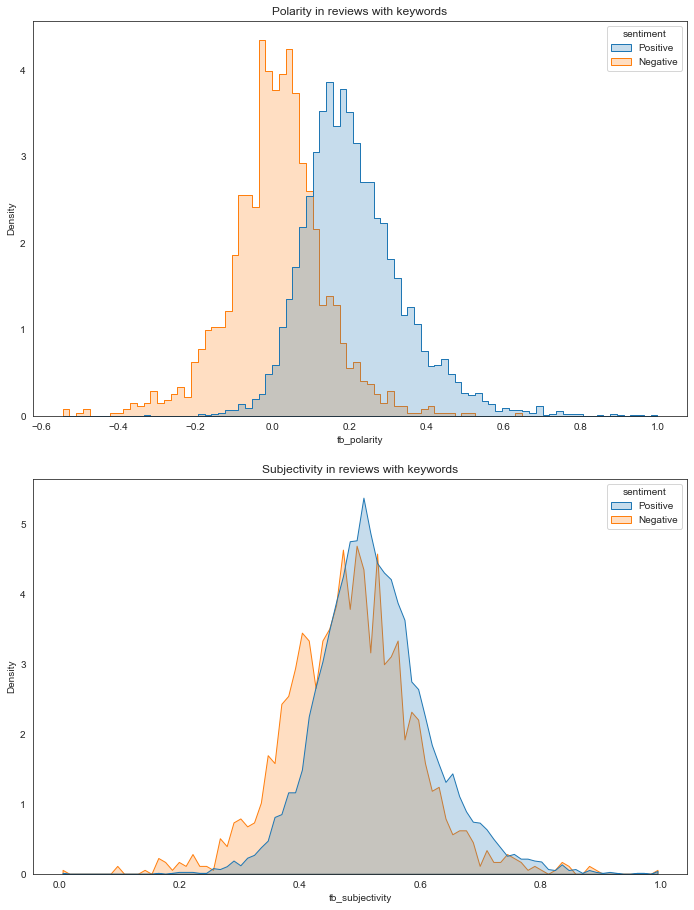

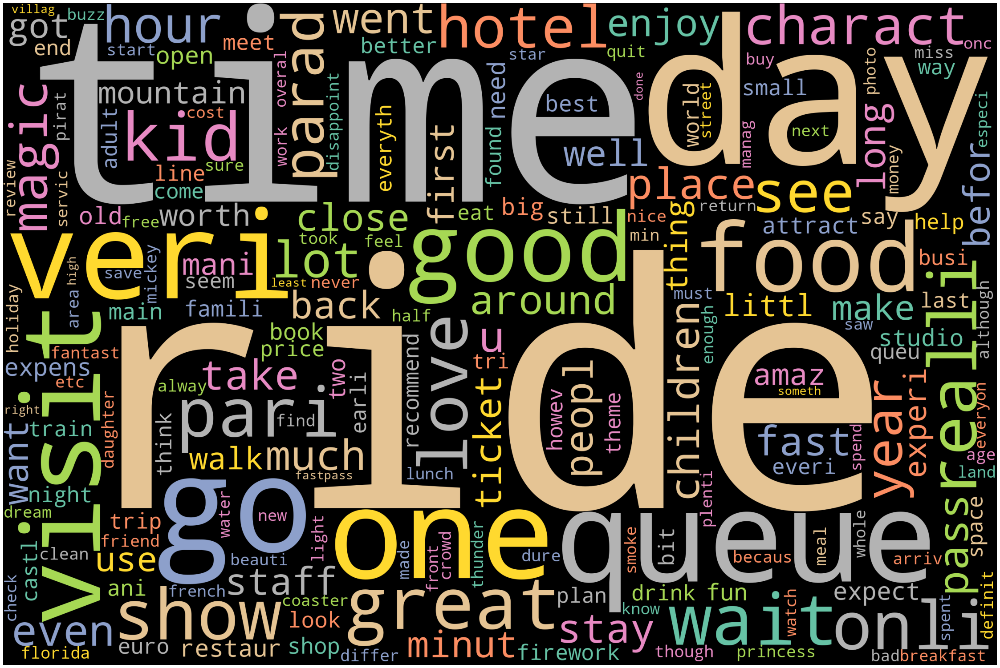

In [39]:
specific_words = ['ride']
print(color.BOLD +"Understanding Polarity and Subjectivity in keywords {}".format(specific_words)+ color.END)
keyword(specific_words)

Understanding Polarity and Subjectivity in keywords ['line', 'queue', 'wait', 'time']
There are 9541 reviews with keywords ['line', 'queue', 'wait', 'time']


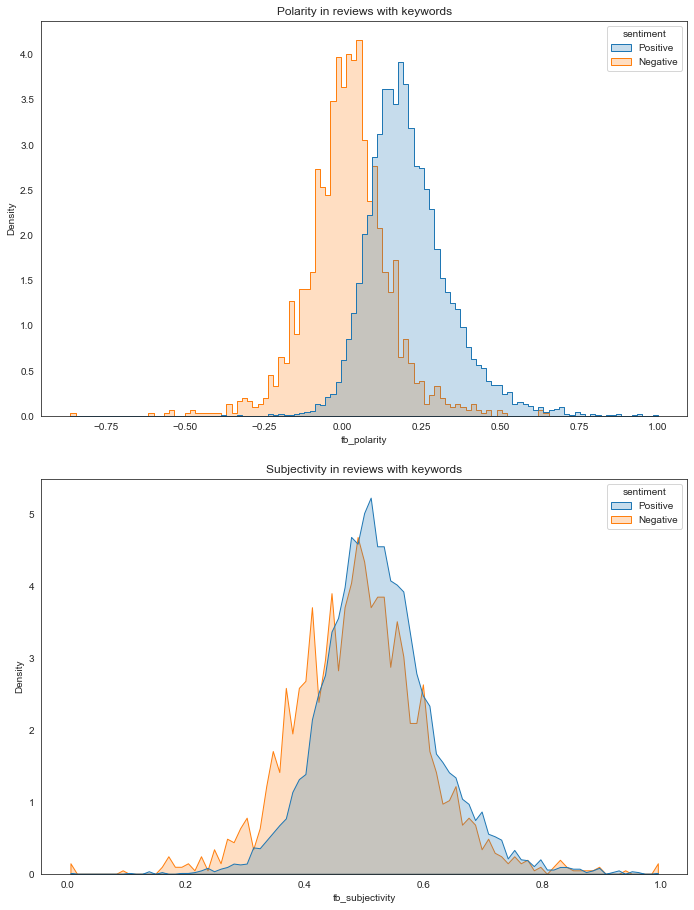

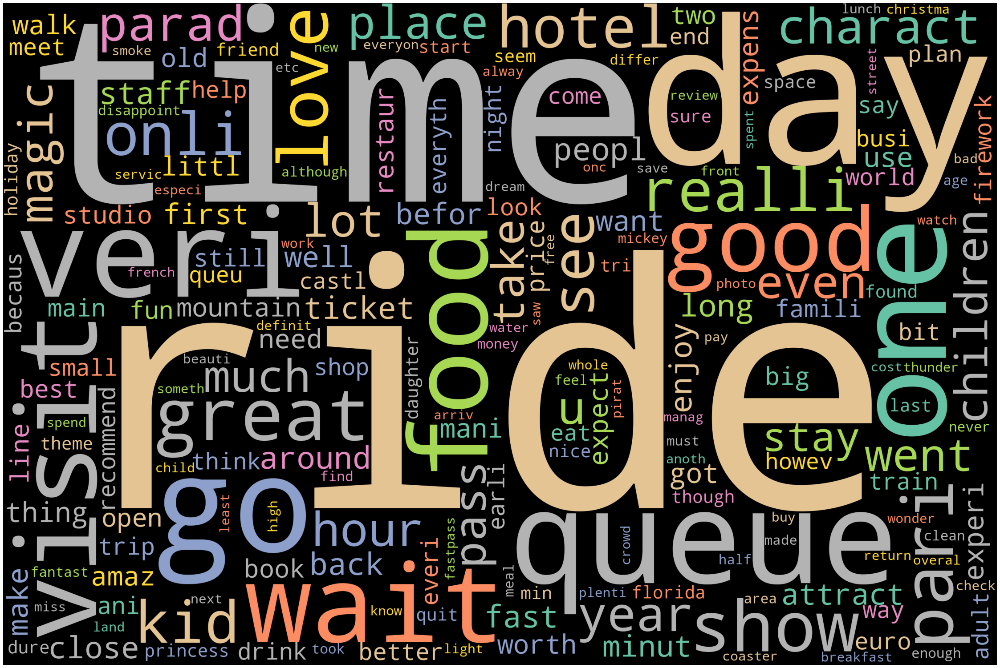

In [40]:
specific_words = ['line', 'queue','wait', 'time']
print(color.BOLD +"Understanding Polarity and Subjectivity in keywords {}".format(specific_words)+ color.END)
keyword(specific_words)

### "Results of sentiment analysis for reviews of Disneyland in California"

In [41]:
branch='California'
branch_data = sentiment_analysis(branch)
branch_data.head()

,Review_ID,Rating,Year_Month,Reviewer_Location,Review_Text,Branch,Year,tb_polarity,tb_subjectivity,vader_pos,vader_neg,vader_comp
9620,670801367,5,2019-4,United States,This place has always been and forever will be...,California,2019,0.311429,0.694286,0.242,0.000,0.9008
9621,670760708,5,2019-4,United States,A great day of simple fun and thrills. Bring c...,California,2019,0.397222,0.450794,0.255,0.000,0.9595
9622,670565072,4,2019-5,Australia,All and all a great day was had. The crowds ar...,California,2019,0.153571,0.575000,0.172,0.081,0.7319
9623,670544335,5,2019-4,United States,Having been to the Florida location numerous t...,California,2019,0.225694,0.539931,0.142,0.081,0.9275
9624,670472278,5,2019-4,Canada,"Had the 4 day pass, spent 3 at DL and one at C...",California,2019,0.340000,0.370000,0.097,0.070,0.0572


In [42]:
branch_data.shape

(19406, 12)

In [43]:
branch_data['vader_comp'].describe()

count    19406.000000
mean         0.702206
std          0.452416
min         -0.997100
25%          0.680800
50%          0.897400
75%          0.964000
max          0.999900
Name: vader_comp, dtype: float64

In [44]:
# labeling the data
#assign sentiment based on compound score

rating = branch_data["vader_comp"]

def rating_label(rating):
    if rating >=0.65:
        return "Positive"
    elif (rating >=0.4) & (rating <= 0.65):
        return "Neutral"
    else:
        return "Negative"
        
branch_data["sentiment"] = branch_data["vader_comp"].apply(lambda x: rating_label(x))  

In [45]:
print(branch_data['sentiment'].value_counts())
branch_data = branch_data[branch_data.sentiment != 'Neutral']

Positive    14875
Negative     2927
Neutral      1604
Name: sentiment, dtype: int64


In [46]:
branch_data['sentiment'].value_counts()

Positive    14875
Negative     2927
Name: sentiment, dtype: int64

Understanding Polarity and Subjectivity in keywords ['fast pass', 'fastpass']
There are 4129 reviews with keywords ['fast pass', 'fastpass']


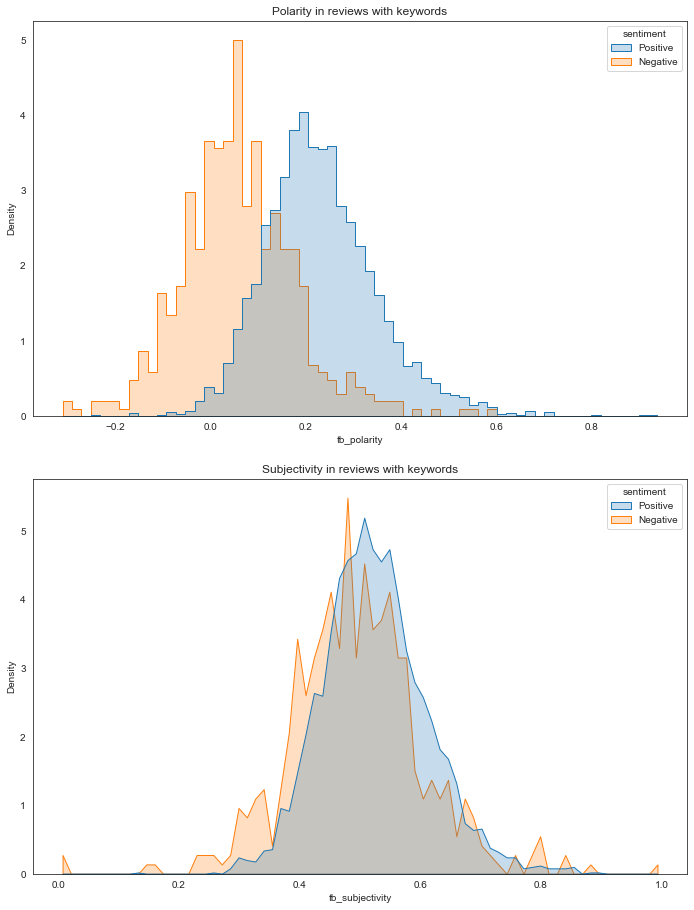

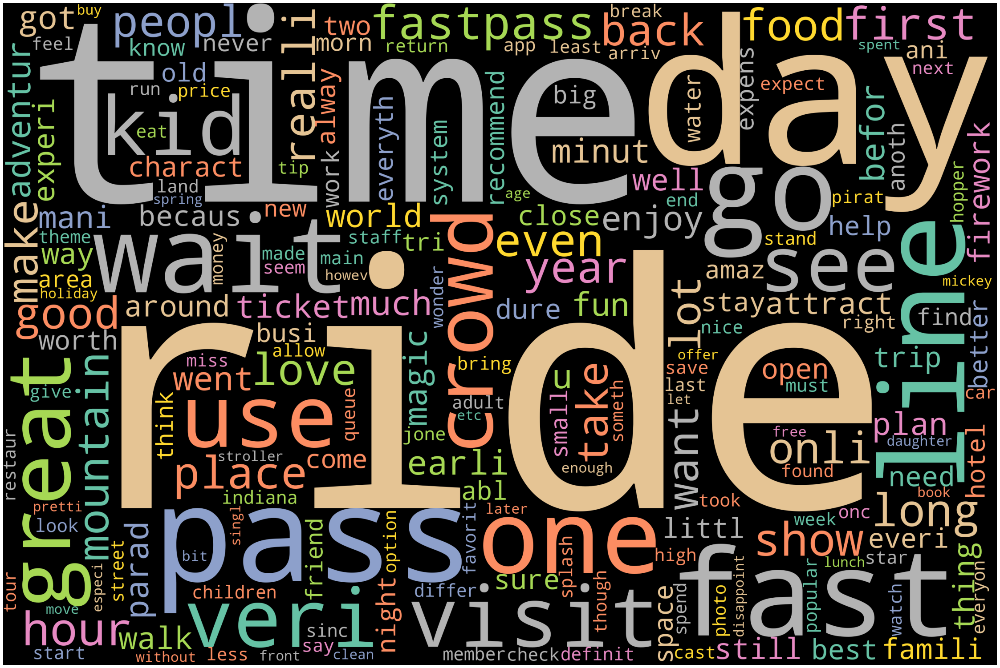

In [47]:
specific_words = ['fast pass', 'fastpass']
print(color.BOLD +"Understanding Polarity and Subjectivity in keywords {}".format(specific_words)+ color.END)
keyword(specific_words)

Understanding Polarity and Subjectivity in keywords ['ride']
There are 9685 reviews with keywords ['ride']


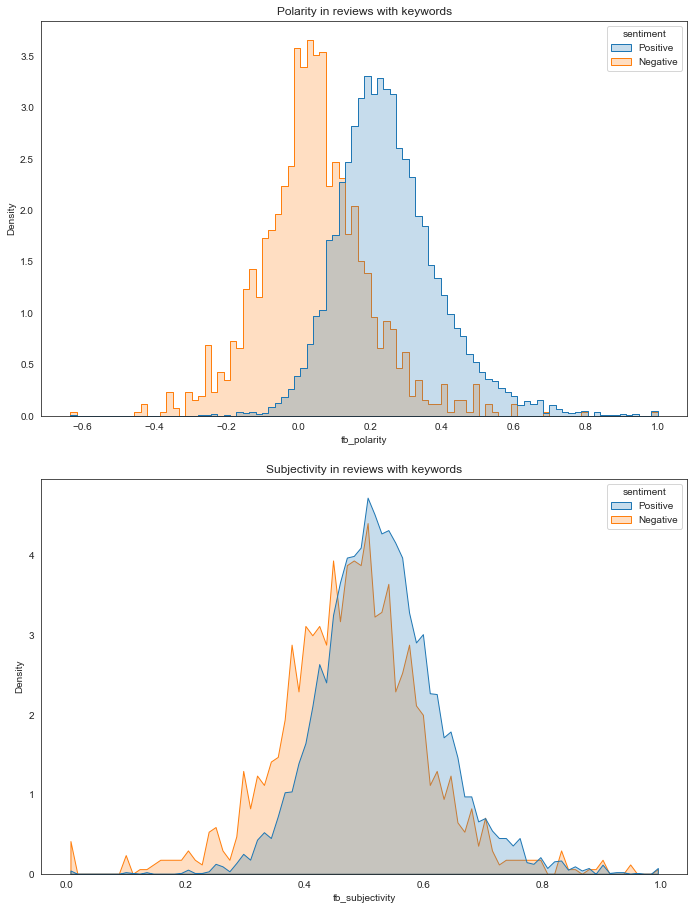

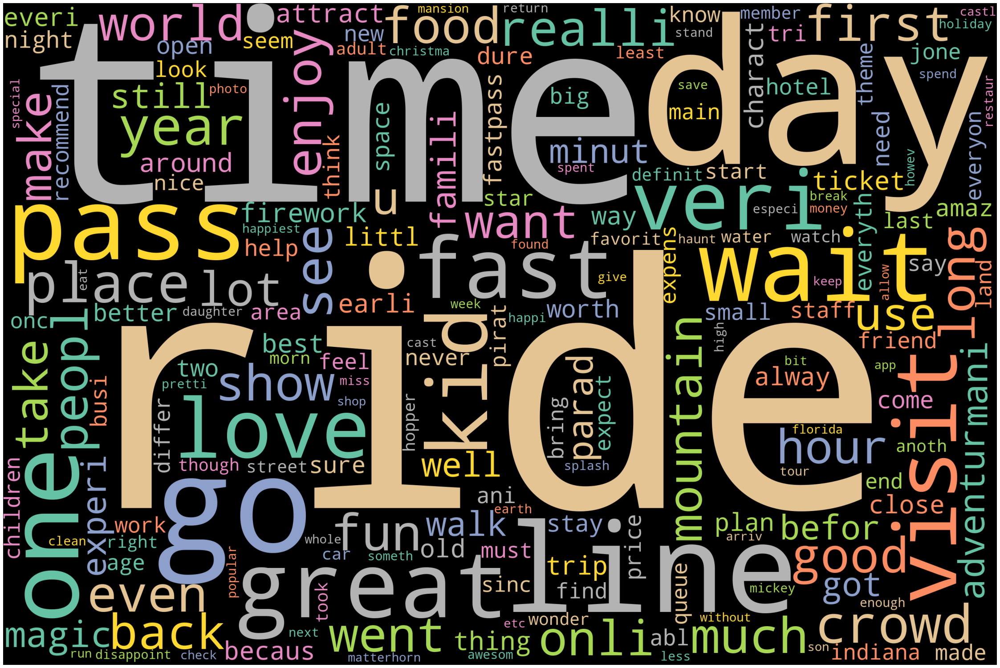

In [48]:
specific_words = ['ride']
print(color.BOLD +"Understanding Polarity and Subjectivity in keywords {}".format(specific_words)+ color.END)
keyword(specific_words)

Understanding Polarity and Subjectivity in keywords ['line', 'queue', 'wait', 'time']
There are 12330 reviews with keywords ['line', 'queue', 'wait', 'time']


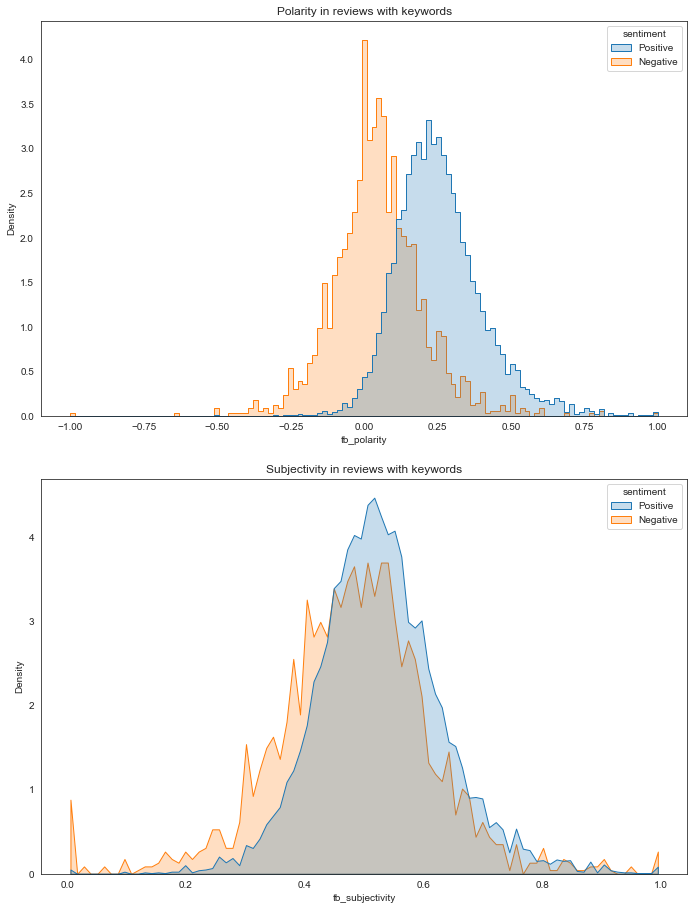

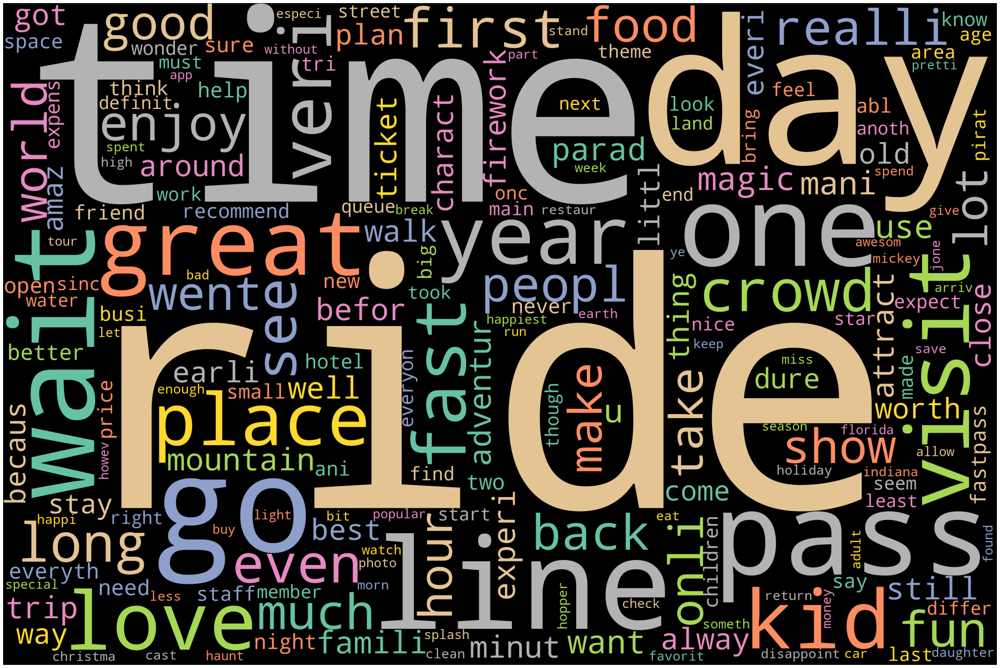

In [49]:
specific_words = ['line', 'queue','wait', 'time']
print(color.BOLD +"Understanding Polarity and Subjectivity in keywords {}".format(specific_words)+ color.END)
keyword(specific_words)

[References1!..](https://towardsdatascience.com/analyzing-disneyland-reviews-b916b6dcccf4)

[References2!..](https://github.com/MarshDee/DisneyNLP)